## IMPORTs

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

### Reading the data

In [13]:
spotify = pd.read_csv("../Data/SpotifyFeatures.csv")

In [14]:
tracks = pd.read_csv("../Data/tracks.csv")

### Spotify

##### Checking null for spotify and fixing it and also reading it

In [15]:
spotify.isna().sum()

genre               0
artist_name         0
track_name          1
track_id            0
popularity          0
acousticness        0
danceability        0
duration_ms         0
energy              0
instrumentalness    0
key                 0
liveness            0
loudness            0
mode                0
speechiness         0
tempo               0
time_signature      0
valence             0
dtype: int64

In [16]:
spotify[spotify['track_name'].isna()]

,genre,artist_name,track_name,track_id,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence
208285,World,Elevation Worship,NaN,7BGQCe62A58Q5ZgpQFX93t,44,0.019,0.287,350027,0.446,0.0,F,0.1,-7.214,Major,0.0317,138.727,4/4,0.0387


#### I have filled the track_name with the repective Track name by searching it using track_id

In [17]:
spotify['track_name'] = spotify['track_name'].fillna('None')

In [18]:
spotify[spotify['track_name'].isna()]

,genre,artist_name,track_name,track_id,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence


In [19]:
spotify.describe()

,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence
count,232725.000000,232725.000000,232725.000000,2.327250e+05,232725.000000,232725.000000,232725.000000,232725.000000,232725.000000,232725.000000,232725.000000
mean,41.127502,0.368560,0.554364,2.351223e+05,0.570958,0.148301,0.215009,-9.569885,0.120765,117.666585,0.454917
std,18.189948,0.354768,0.185608,1.189359e+05,0.263456,0.302768,0.198273,5.998204,0.185518,30.898907,0.260065
min,0.000000,0.000000,0.056900,1.538700e+04,0.000020,0.000000,0.009670,-52.457000,0.022200,30.379000,0.000000
25%,29.000000,0.037600,0.435000,1.828570e+05,0.385000,0.000000,0.097400,-11.771000,0.036700,92.959000,0.237000
50%,43.000000,0.232000,0.571000,2.204270e+05,0.605000,0.000044,0.128000,-7.762000,0.050100,115.778000,0.444000
75%,55.000000,0.722000,0.692000,2.657680e+05,0.787000,0.035800,0.264000,-5.501000,0.105000,139.054000,0.660000
max,100.000000,0.996000,0.989000,5.552917e+06,0.999000,0.999000,1.000000,3.744000,0.967000,242.903000,1.000000


In [20]:
spotify.shape

(232725, 18)

In [21]:
spotify.head(5)

,genre,artist_name,track_name,track_id,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence
0,Movie,Henri Salvador,C'est beau de faire un Show,0BRjO6ga9RKCKjfDqeFgWV,0,0.611,0.389,99373,0.910,0.000,C#,0.3460,-1.828,Major,0.0525,166.969,4/4,0.814
1,Movie,Martin & les fées,Perdu d'avance (par Gad Elmaleh),0BjC1NfoEOOusryehmNudP,1,0.246,0.590,137373,0.737,0.000,F#,0.1510,-5.559,Minor,0.0868,174.003,4/4,0.816
2,Movie,Joseph Williams,Don't Let Me Be Lonely Tonight,0CoSDzoNIKCRs124s9uTVy,3,0.952,0.663,170267,0.131,0.000,C,0.1030,-13.879,Minor,0.0362,99.488,5/4,0.368
3,Movie,Henri Salvador,Dis-moi Monsieur Gordon Cooper,0Gc6TVm52BwZD07Ki6tIvf,0,0.703,0.240,152427,0.326,0.000,C#,0.0985,-12.178,Major,0.0395,171.758,4/4,0.227
4,Movie,Fabien Nataf,Ouverture,0IuslXpMROHdEPvSl1fTQK,4,0.950,0.331,82625,0.225,0.123,F,0.2020,-21.150,Major,0.0456,140.576,4/4,0.390


In [22]:
spotify.tail()

,genre,artist_name,track_name,track_id,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence
232720,Soul,Slave,Son Of Slide,2XGLdVl7lGeq8ksM6Al7jT,39,0.00384,0.687,326240,0.714,0.544000,D,0.0845,-10.626,Major,0.0316,115.542,4/4,0.962
232721,Soul,Jr Thomas & The Volcanos,Burning Fire,1qWZdkBl4UVPj9lK6HuuFM,38,0.03290,0.785,282447,0.683,0.000880,E,0.2370,-6.944,Minor,0.0337,113.830,4/4,0.969
232722,Soul,Muddy Waters,(I'm Your) Hoochie Coochie Man,2ziWXUmQLrXTiYjCg2fZ2t,47,0.90100,0.517,166960,0.419,0.000000,D,0.0945,-8.282,Major,0.1480,84.135,4/4,0.813
232723,Soul,R.LUM.R,With My Words,6EFsue2YbIG4Qkq8Zr9Rir,44,0.26200,0.745,222442,0.704,0.000000,A,0.3330,-7.137,Major,0.1460,100.031,4/4,0.489
232724,Soul,Mint Condition,You Don't Have To Hurt No More,34XO9RwPMKjbvRry54QzWn,35,0.09730,0.758,323027,0.470,0.000049,G#,0.0836,-6.708,Minor,0.0287,113.897,4/4,0.479


## EDA

/var/folders/hd/8z3slh4d16d2yvs205jh8smw0000gn/T/ipykernel_12795/3855954659.py:2: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = plt.cm.get_cmap('RdPu')


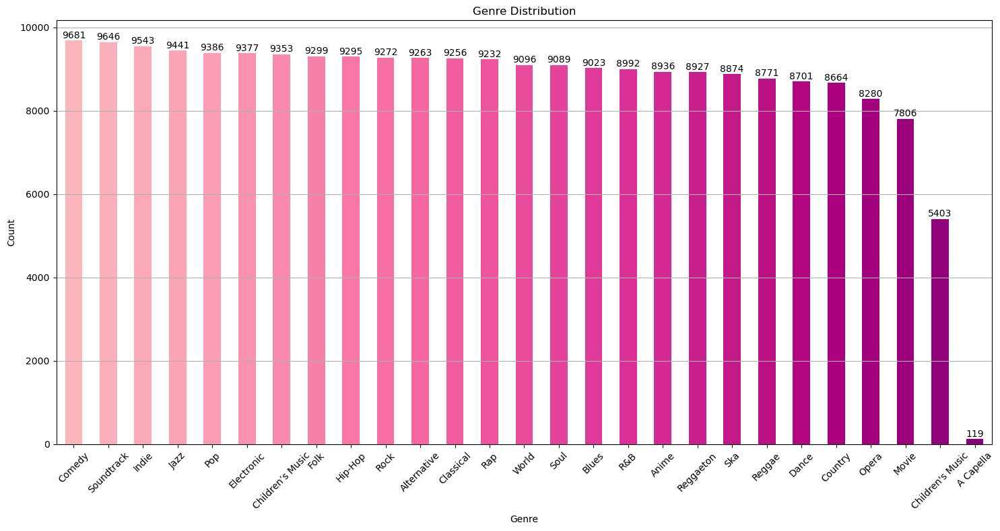

In [23]:
colors = np.linspace(0.3, 0.9, 30)  
cmap = plt.cm.get_cmap('RdPu')  

plt.figure(figsize=(15, 8))
genre_counts = spotify['genre'].value_counts()
genre_counts.plot(kind='bar', color=cmap(colors))

for i, count in enumerate(genre_counts):
    plt.text(i, count + 10, str(count), ha='center', va='bottom')

plt.xlabel('Genre')
plt.xticks(rotation=45)
plt.ylabel('Count')
plt.title('Genre Distribution')
plt.grid(axis='y')
plt.tight_layout()
plt.show();

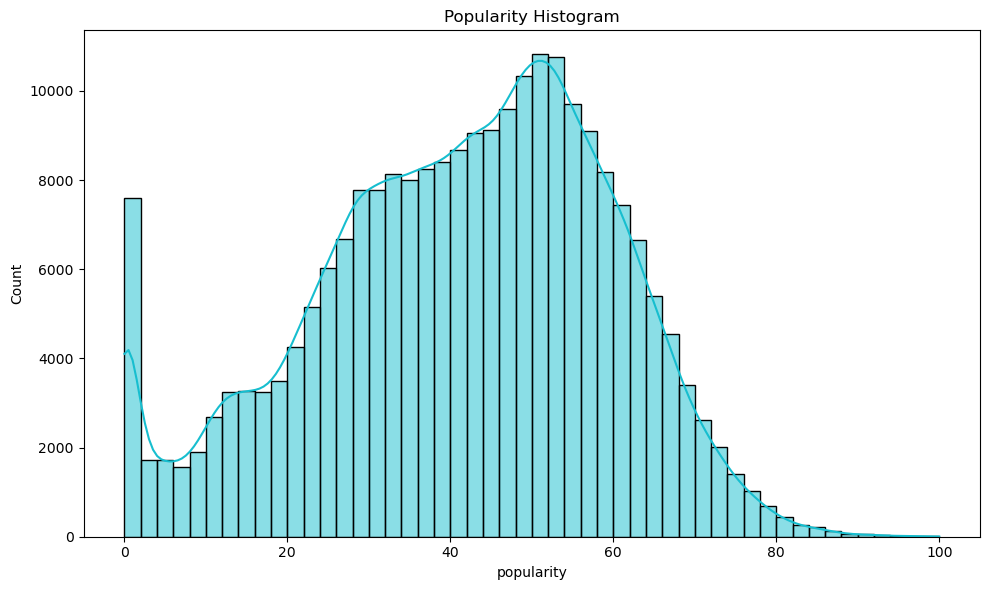

In [24]:
plt.figure(figsize=(10, 6))

sns.histplot(spotify['popularity'], bins=50, kde=True, color='tab:cyan')
plt.title('Popularity Histogram')
plt.margins(x=0.05, y=0.05)
plt.tight_layout()
plt.show()

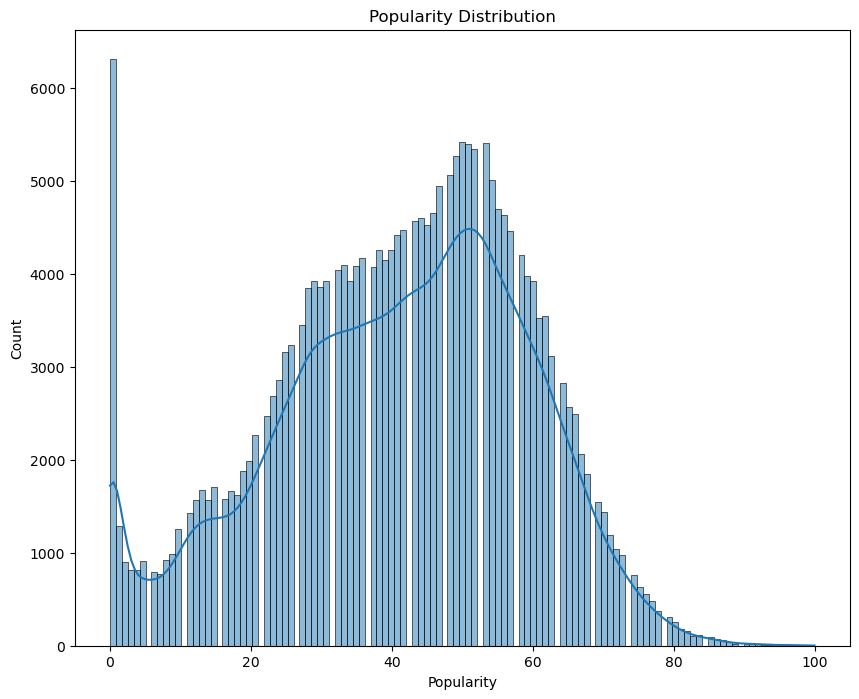

In [27]:
# Visualize distributions: popularity
plt.figure(figsize=(10, 8))
sns.histplot(spotify["popularity"], kde=True)
plt.title("Popularity Distribution")
plt.xlabel("Popularity")
plt.ylabel("Count")
plt.show()

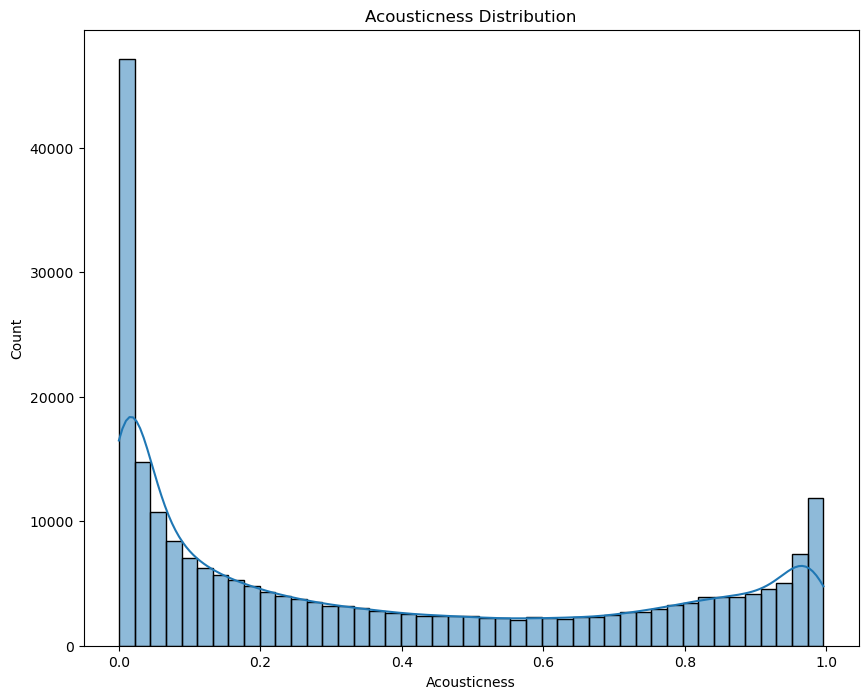

In [28]:
plt.figure(figsize=(10, 8))
sns.histplot(spotify["acousticness"], kde=True)
plt.title("Acousticness Distribution")
plt.xlabel("Acousticness")
plt.ylabel("Count")
plt.show()

In [30]:
popularity_1 = spotify[spotify['popularity']<=25]

In [31]:
popularity_1.columns

Index(['genre', 'artist_name', 'track_name', 'track_id', 'popularity',
       'acousticness', 'danceability', 'duration_ms', 'energy',
       'instrumentalness', 'key', 'liveness', 'loudness', 'mode',
       'speechiness', 'tempo', 'time_signature', 'valence'],
      dtype='object')

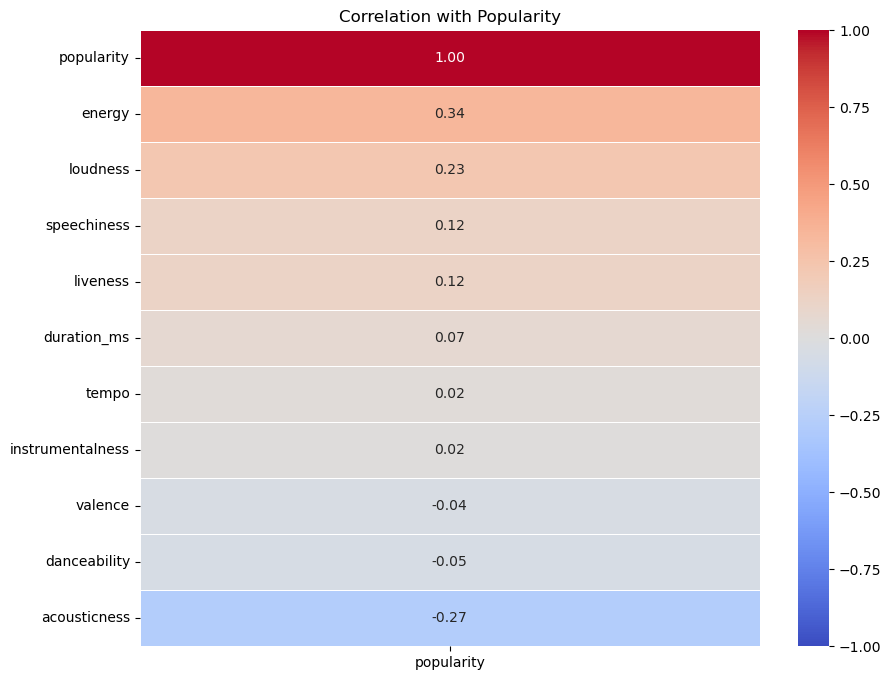

In [32]:
correlation_matrix = popularity_1.corr(numeric_only=True)[['popularity']].sort_values(by='popularity', ascending=False)

plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix,
            annot=True,              # Show values inside the cells
            cmap='coolwarm',           # Set colormap
            fmt=".2f",               # Format for annotations
            linewidths=.5,           # Width of the lines that will divide each cell
            vmin=-1, vmax=1)         # Set the color intensity limits
plt.title('Correlation with Popularity')
plt.show()

In [33]:
spo = spotify.corr(numeric_only=True)
spo

,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence
popularity,1.000000,-0.381295,0.256564,0.002348,0.248922,-0.210983,-0.167995,0.363011,-0.151076,0.081039,0.060076
acousticness,-0.381295,1.000000,-0.364546,0.011203,-0.725576,0.316154,0.069004,-0.690202,0.150935,-0.238247,-0.325798
danceability,0.256564,-0.364546,1.000000,-0.125781,0.325807,-0.364941,-0.041684,0.438668,0.134560,0.021939,0.547154
duration_ms,0.002348,0.011203,-0.125781,1.000000,-0.030550,0.076021,0.023783,-0.047618,-0.016171,-0.028456,-0.141811
energy,0.248922,-0.725576,0.325807,-0.030550,1.000000,-0.378957,0.192801,0.816088,0.145120,0.228774,0.436771
instrumentalness,-0.210983,0.316154,-0.364941,0.076021,-0.378957,1.000000,-0.134198,-0.506320,-0.177147,-0.104133,-0.307522
liveness,-0.167995,0.069004,-0.041684,0.023783,0.192801,-0.134198,1.000000,0.045686,0.510147,-0.051355,0.011804
loudness,0.363011,-0.690202,0.438668,-0.047618,0.816088,-0.506320,0.045686,1.000000,-0.002273,0.228364,0.399901
speechiness,-0.151076,0.150935,0.134560,-0.016171,0.145120,-0.177147,0.510147,-0.002273,1.000000,-0.081541,0.023842
tempo,0.081039,-0.238247,0.021939,-0.028456,0.228774,-0.104133,-0.051355,0.228364,-0.081541,1.000000,0.134857


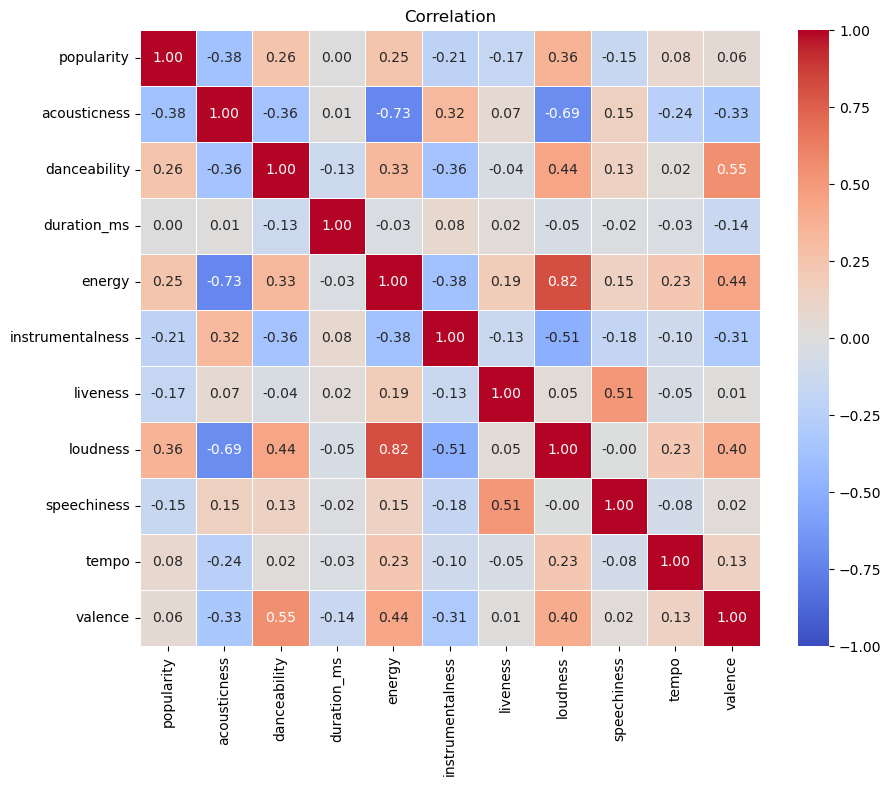

In [34]:
plt.figure(figsize=(10, 8))
sns.heatmap(spo,
            annot=True,              
            cmap='coolwarm',         
            fmt=".2f",               
            linewidths=.5,           
            vmin=-1, vmax=1)         
plt.title('Correlation')
plt.show()

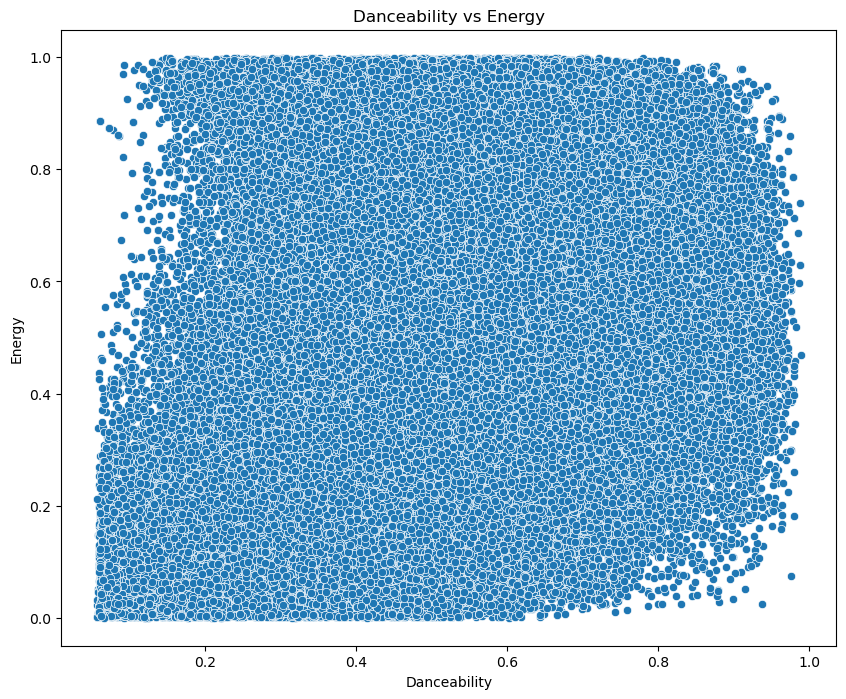

In [35]:
# Exploring relationships
plt.figure(figsize=(10, 8))
sns.scatterplot(x="danceability", y="energy", data=spotify)
plt.title("Danceability vs Energy")
plt.xlabel("Danceability")
plt.ylabel("Energy")
plt.show()

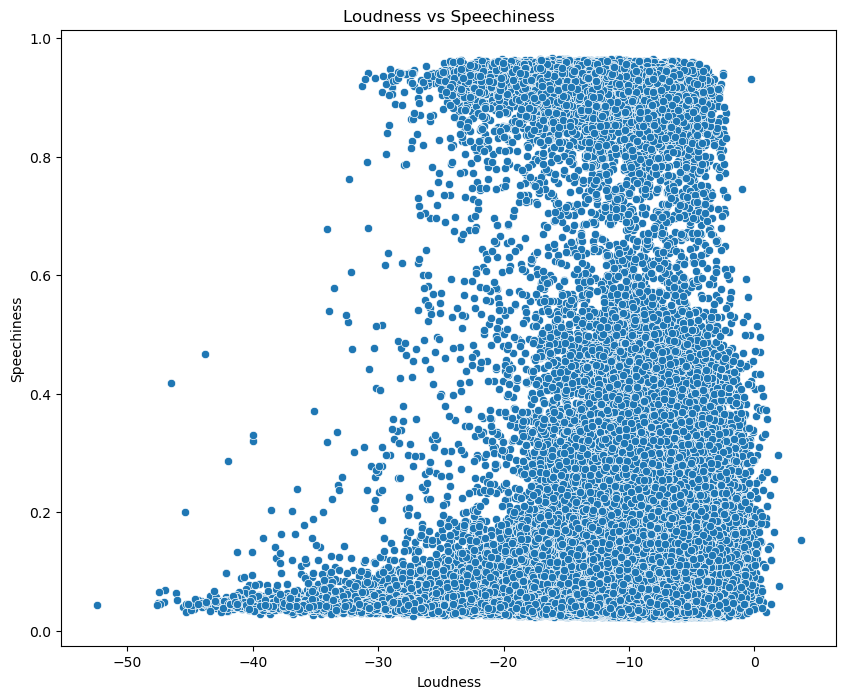

In [36]:
plt.figure(figsize=(10, 8))
sns.scatterplot(x="loudness", y="speechiness", data=spotify)
plt.title("Loudness vs Speechiness")
plt.xlabel("Loudness")
plt.ylabel("Speechiness")
plt.show()

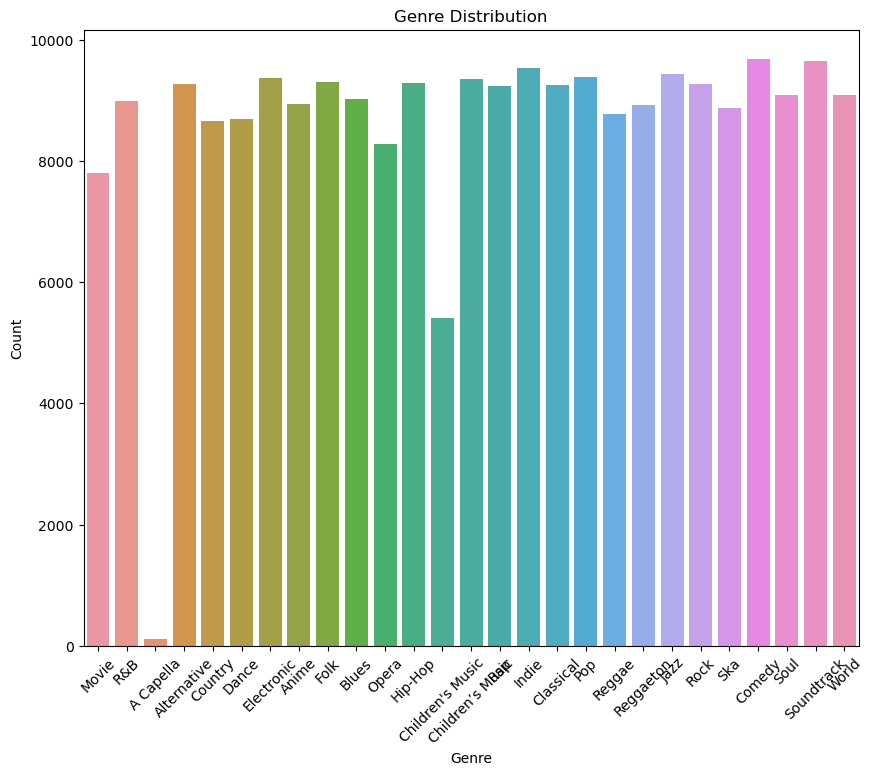

In [37]:
#genre distribution
plt.figure(figsize=(10, 8))
sns.countplot(x="genre", data=spotify)
plt.title("Genre Distribution")
plt.xlabel("Genre")
plt.ylabel("Count")
plt.xticks(rotation=45)
plt.show()

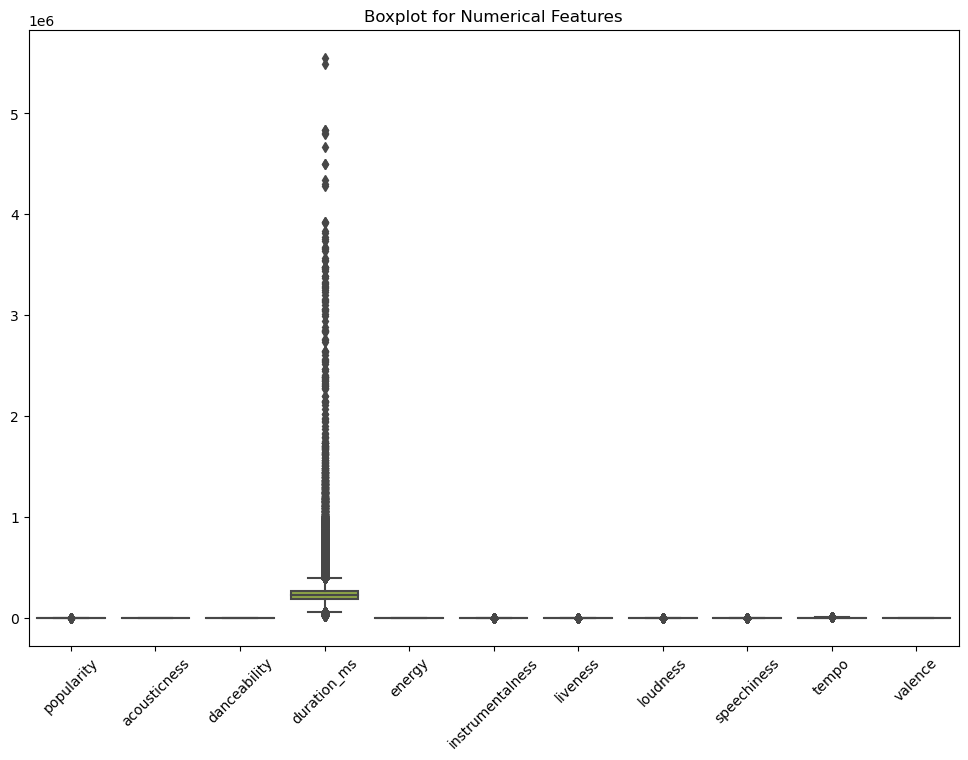

In [38]:
#for numerical features
plt.figure(figsize=(12, 8))
sns.boxplot(data=spotify.drop(columns=["track_name", "track_id", "mode", "time_signature"]))
plt.title("Boxplot for Numerical Features")
plt.xticks(rotation=45)
plt.show()

/Users/rajashreechoudhary/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


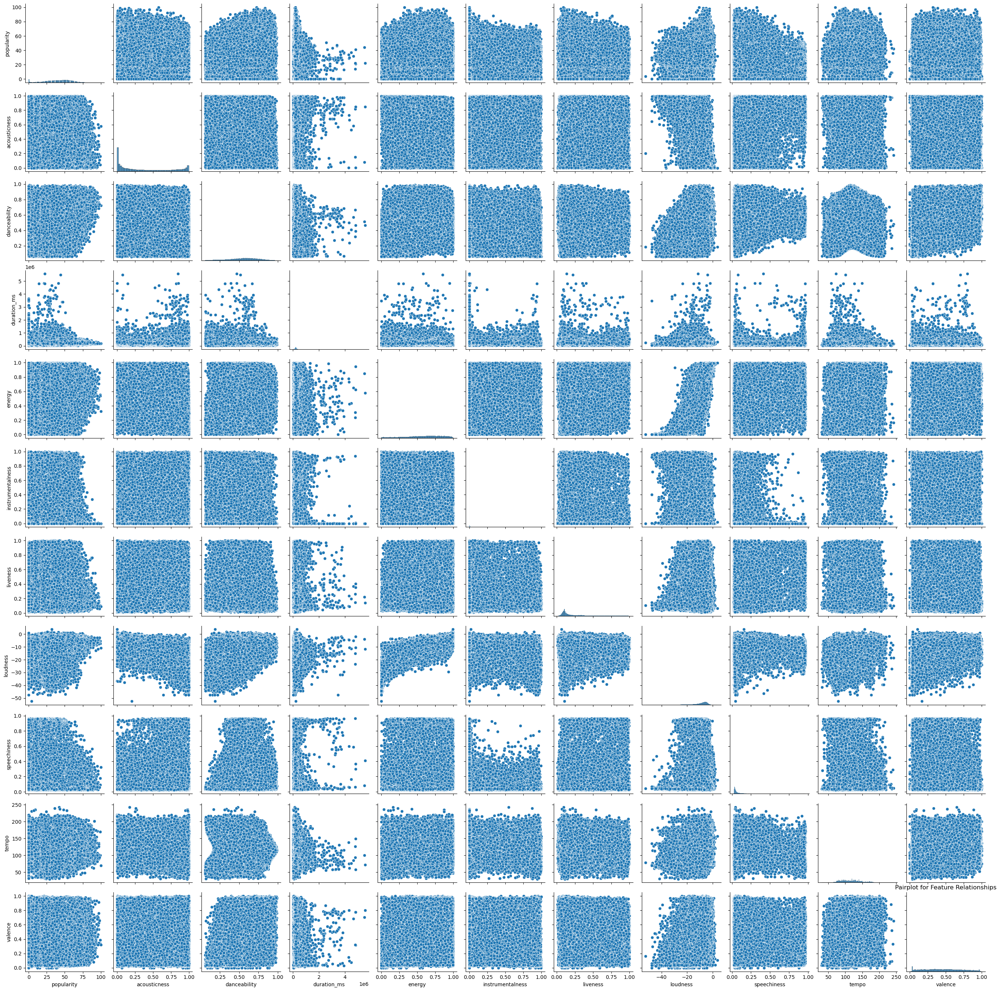

In [39]:
#Feature Relationships
sns.pairplot(spotify.drop(columns=["track_name", "track_id", "mode", "time_signature"]))
plt.title("Pairplot for Feature Relationships")
plt.show()

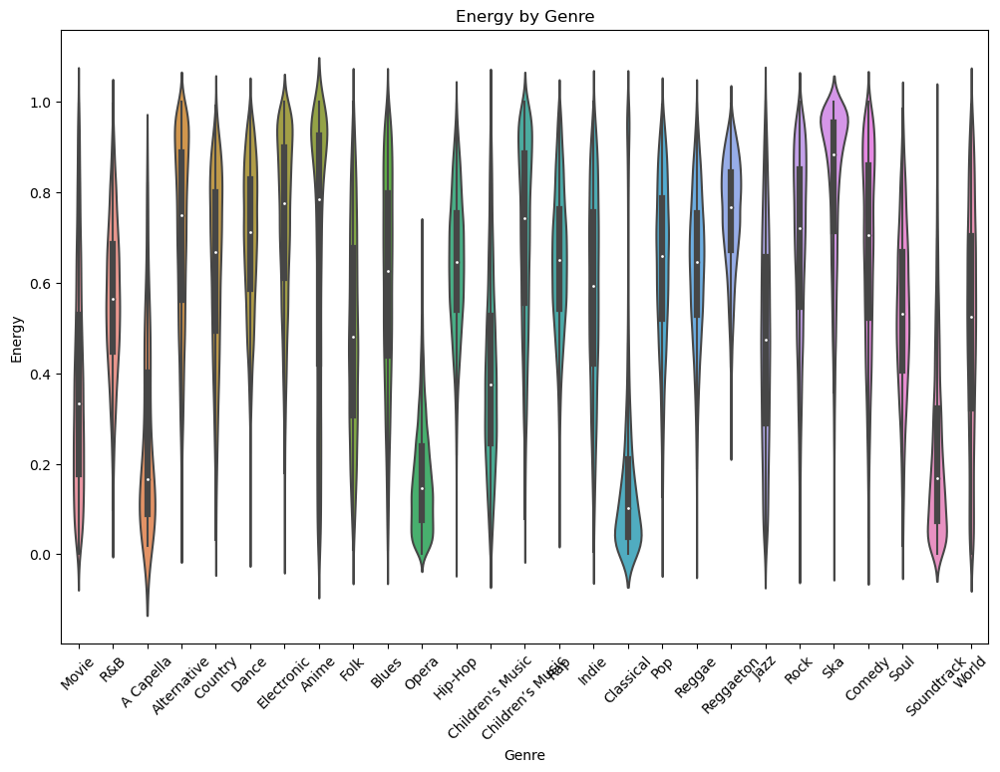

In [40]:
#Violin plot - Energy by Genre
plt.figure(figsize=(12, 8))
sns.violinplot(x="genre", y="energy", data=spotify)
plt.title("Energy by Genre")
plt.xlabel("Genre")
plt.ylabel("Energy")
plt.xticks(rotation=45)
plt.show()

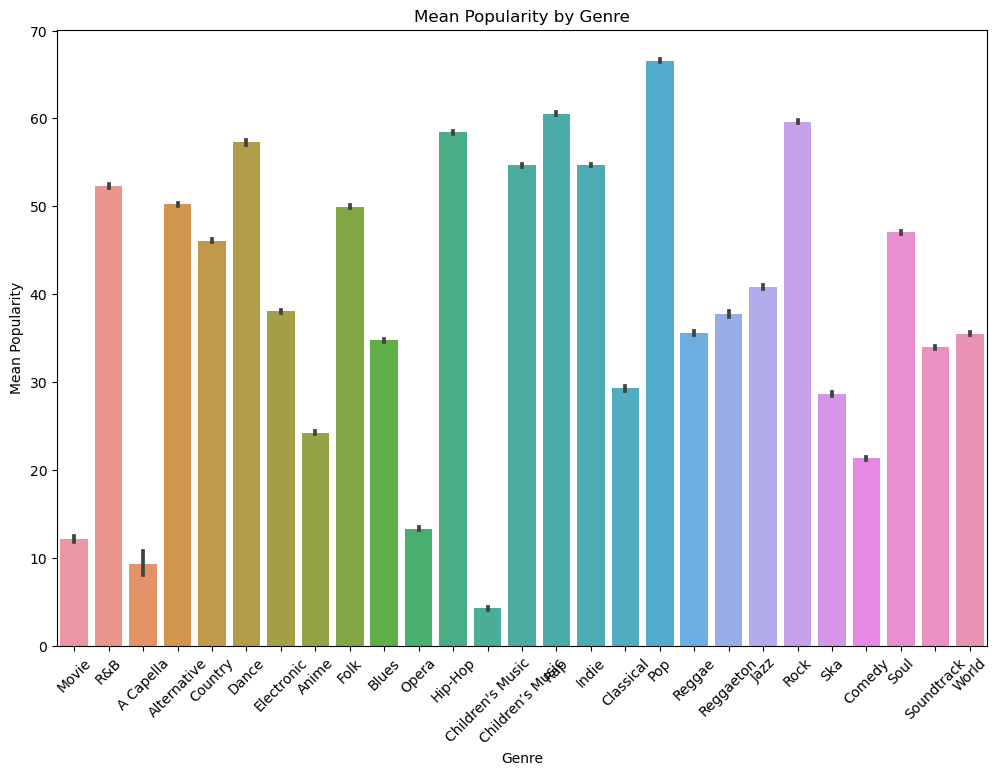

In [41]:
#Barplot for Mean Popularity by Genre
plt.figure(figsize=(12, 8))
sns.barplot(x="genre", y="popularity", data=spotify, estimator=np.mean)
plt.title("Mean Popularity by Genre")
plt.xlabel("Genre")
plt.ylabel("Mean Popularity")
plt.xticks(rotation=45)
plt.show()

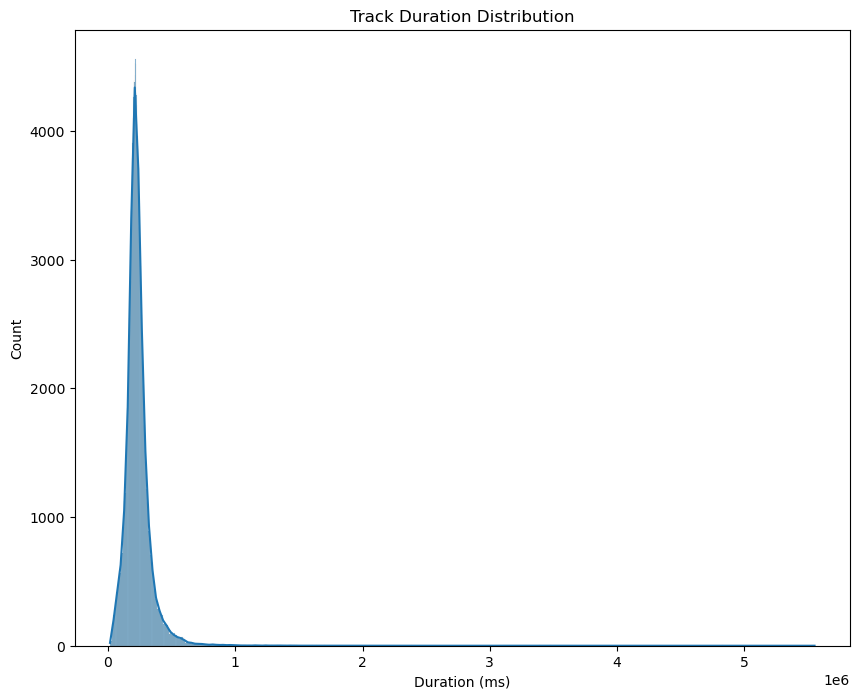

In [42]:
#Distribution of track durations
plt.figure(figsize=(10, 8))
sns.histplot(spotify["duration_ms"], kde=True)
plt.title("Track Duration Distribution")
plt.xlabel("Duration (ms)")
plt.ylabel("Count")
plt.show()

## Tracks

In [43]:
tracks.head()

,id,name,popularity,duration_ms,explicit,artists,id_artists,release_date,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature
0,35iwgR4jXetI318WEWsa1Q,Carve,6,126903,0,['Uli'],['45tIt06XoI0Iio4LBEVpls'],1922-02-22,0.645,0.4450,0,-13.338,1,0.4510,0.674,0.7440,0.151,0.127,104.851,3
1,021ht4sdgPcrDgSk7JTbKY,Capítulo 2.16 - Banquero Anarquista,0,98200,0,['Fernando Pessoa'],['14jtPCOoNZwquk5wd9DxrY'],1922-06-01,0.695,0.2630,0,-22.136,1,0.9570,0.797,0.0000,0.148,0.655,102.009,1
2,07A5yehtSnoedViJAZkNnc,Vivo para Quererte - Remasterizado,0,181640,0,['Ignacio Corsini'],['5LiOoJbxVSAMkBS2fUm3X2'],1922-03-21,0.434,0.1770,1,-21.180,1,0.0512,0.994,0.0218,0.212,0.457,130.418,5
3,08FmqUhxtyLTn6pAh6bk45,El Prisionero - Remasterizado,0,176907,0,['Ignacio Corsini'],['5LiOoJbxVSAMkBS2fUm3X2'],1922-03-21,0.321,0.0946,7,-27.961,1,0.0504,0.995,0.9180,0.104,0.397,169.980,3
4,08y9GfoqCWfOGsKdwojr5e,Lady of the Evening,0,163080,0,['Dick Haymes'],['3BiJGZsyX9sJchTqcSA7Su'],1922,0.402,0.1580,3,-16.900,0,0.0390,0.989,0.1300,0.311,0.196,103.220,4


In [44]:
print(tracks.describe())

          popularity   duration_ms       explicit   danceability  \
count  586672.000000  5.866720e+05  586672.000000  586672.000000   
mean       27.570053  2.300512e+05       0.044086       0.563594   
std        18.370642  1.265261e+05       0.205286       0.166103   
min         0.000000  3.344000e+03       0.000000       0.000000   
25%        13.000000  1.750930e+05       0.000000       0.453000   
50%        27.000000  2.148930e+05       0.000000       0.577000   
75%        41.000000  2.638670e+05       0.000000       0.686000   
max       100.000000  5.621218e+06       1.000000       0.991000   

              energy            key       loudness           mode  \
count  586672.000000  586672.000000  586672.000000  586672.000000   
mean        0.542036       5.221603     -10.206067       0.658797   
std         0.251923       3.519423       5.089328       0.474114   
min         0.000000       0.000000     -60.000000       0.000000   
25%         0.343000       2.000000     -1

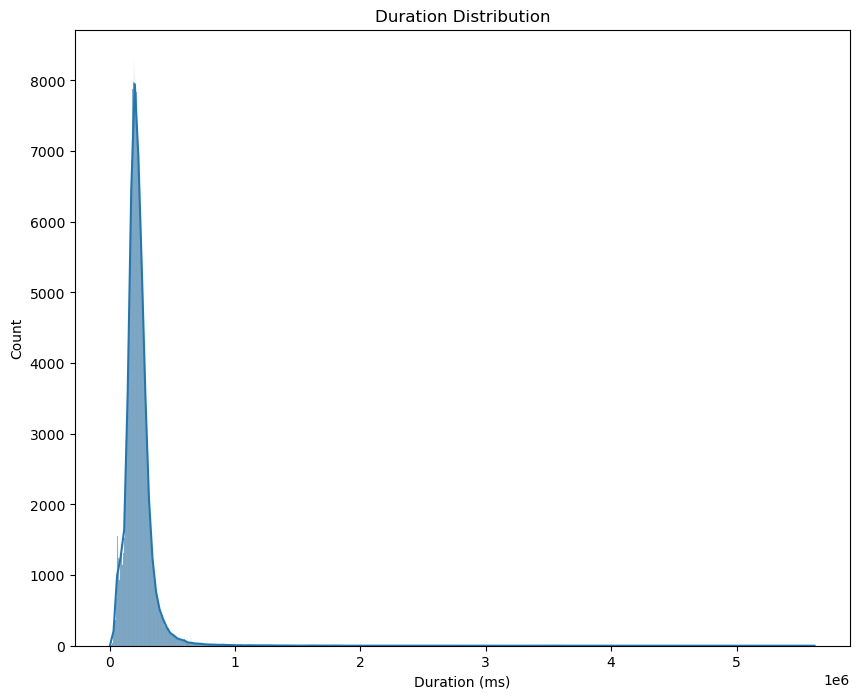

In [45]:
plt.figure(figsize=(10, 8))
sns.histplot(tracks["duration_ms"], kde=True)
plt.title("Duration Distribution")
plt.xlabel("Duration (ms)")
plt.ylabel("Count")
plt.show()

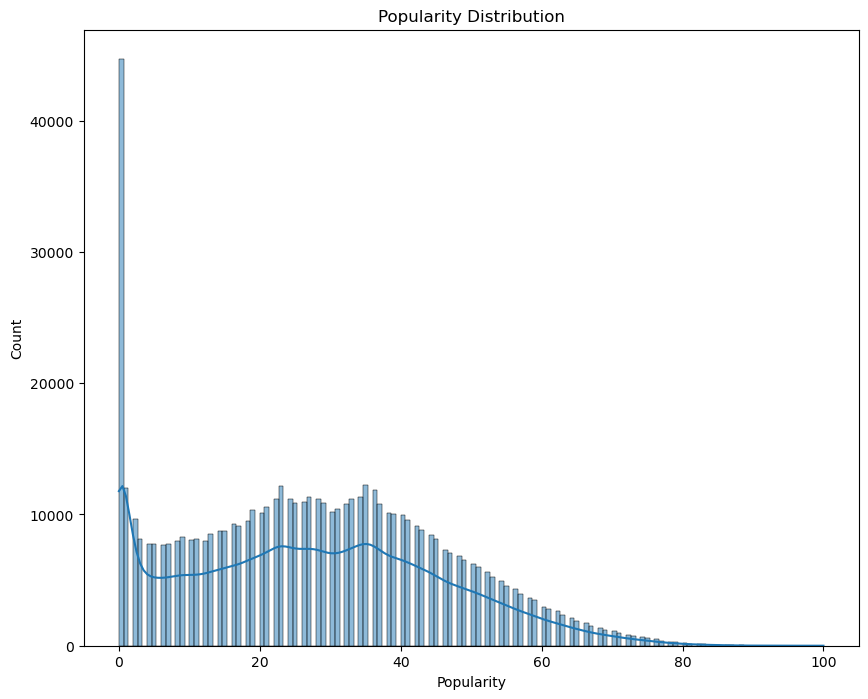

In [46]:
plt.figure(figsize=(10, 8))
sns.histplot(tracks["popularity"], kde=True)
plt.title("Popularity Distribution")
plt.xlabel("Popularity")
plt.ylabel("Count")
plt.show()

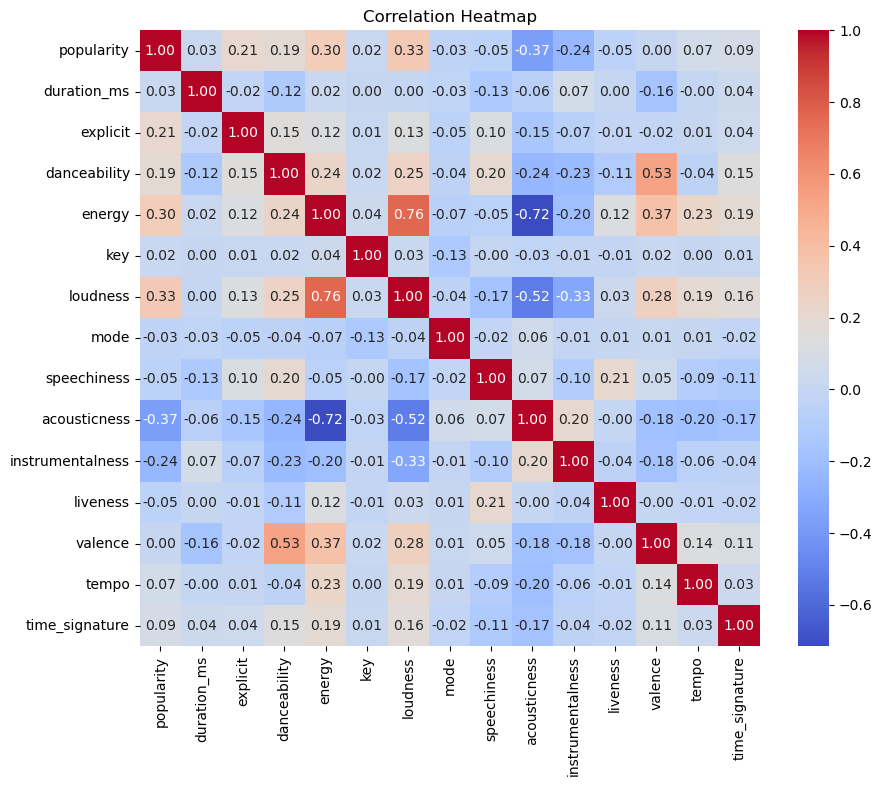

In [48]:
# Visualizing correlations
plt.figure(figsize=(10, 8))
sns.heatmap(tracks.corr(numeric_only=True), annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Correlation Heatmap")
plt.show()

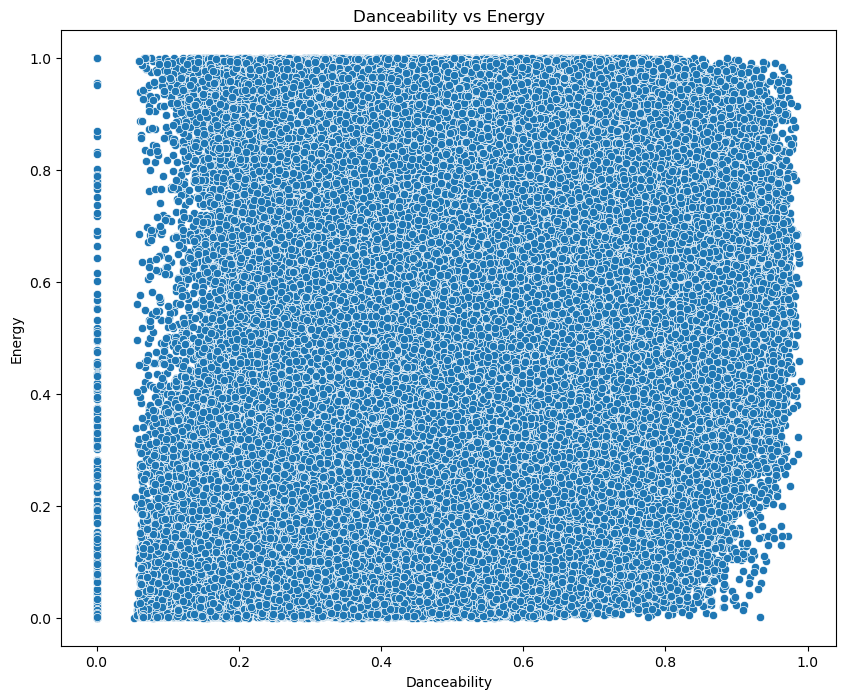

In [49]:
# Exploring relationships

plt.figure(figsize=(10, 8))
sns.scatterplot(x="danceability", y="energy", data=tracks)
plt.title("Danceability vs Energy")
plt.xlabel("Danceability")
plt.ylabel("Energy")
plt.show()

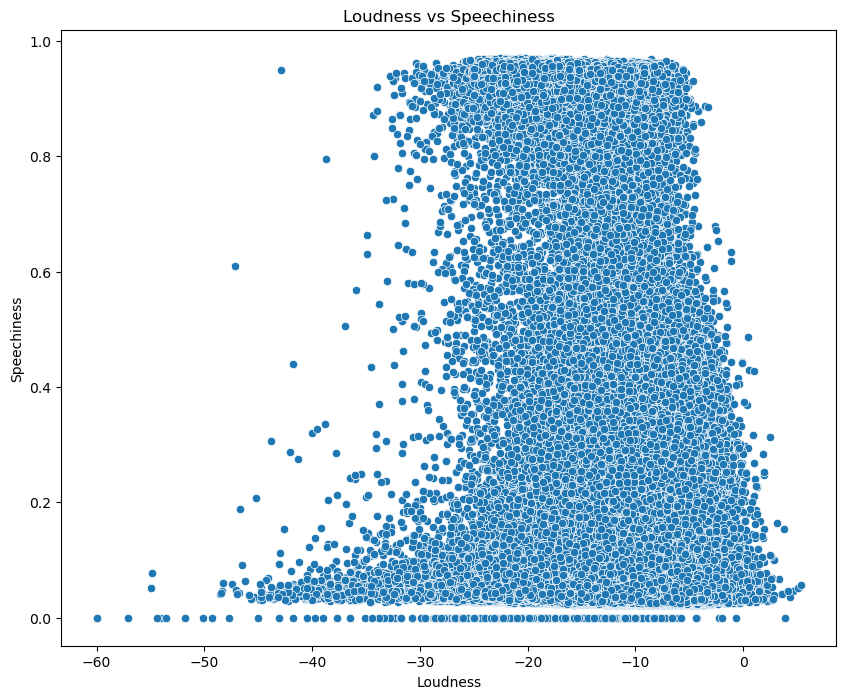

In [50]:
plt.figure(figsize=(10, 8))
sns.scatterplot(x="loudness", y="speechiness", data=tracks)
plt.title("Loudness vs Speechiness")
plt.xlabel("Loudness")
plt.ylabel("Speechiness")
plt.show()

#### Distribution

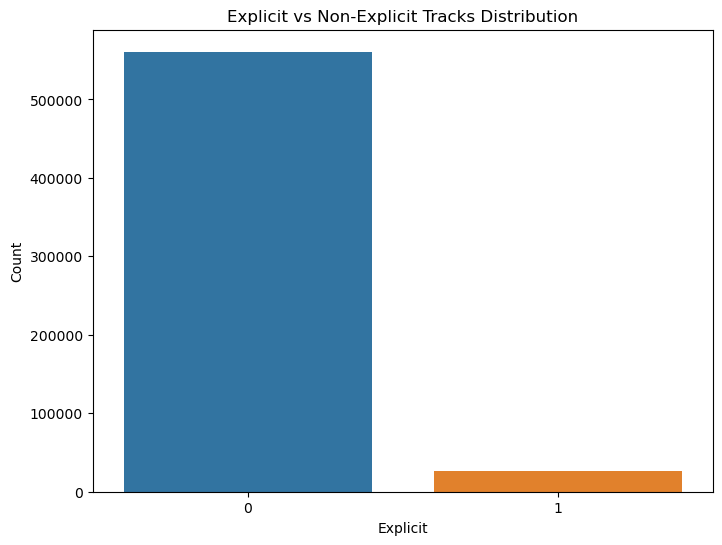

In [52]:
#Explicit vs Non-Explicit Tracks
plt.figure(figsize=(8, 6))
sns.countplot(x="explicit", data=tracks)
plt.title("Explicit vs Non-Explicit Tracks Distribution")
plt.xlabel("Explicit")
plt.ylabel("Count")
plt.show()

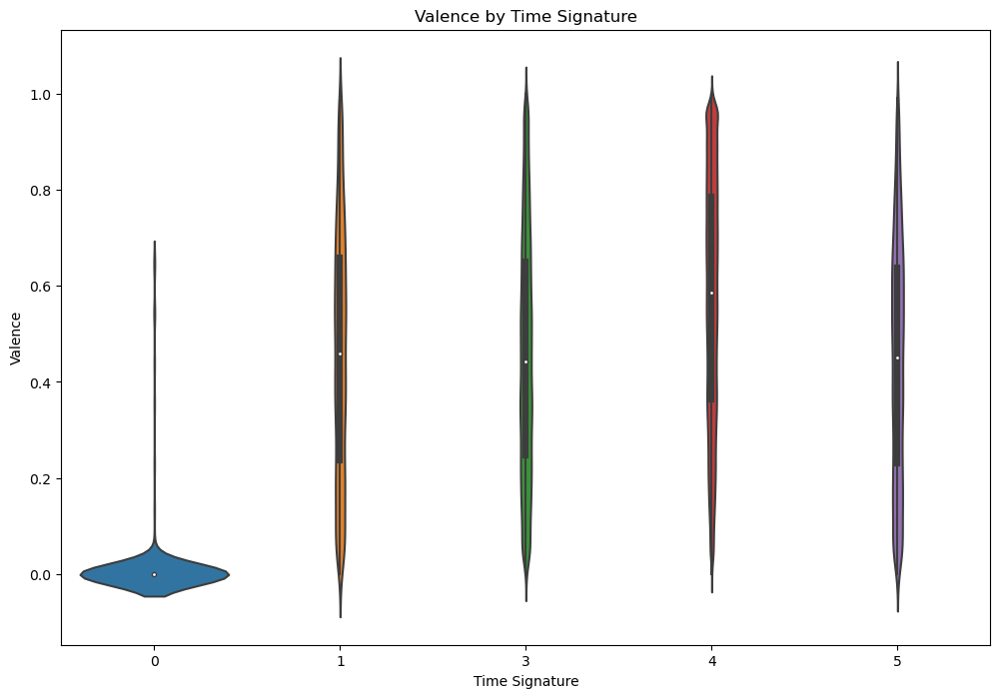

In [56]:
#Violin Plot for Valence by Time Signature

plt.figure(figsize=(12, 8))
sns.violinplot(x="time_signature", y="valence", data=tracks)
plt.title("Valence by Time Signature")
plt.xlabel("Time Signature")
plt.ylabel("Valence")
plt.show()

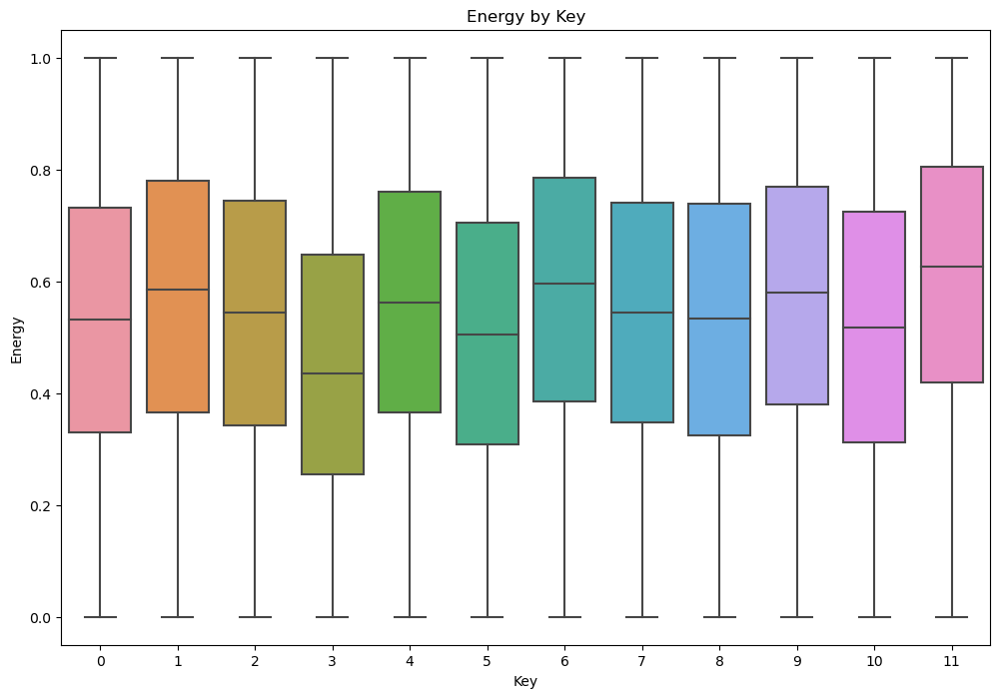

In [57]:
#Boxplot for energy by Key
plt.figure(figsize=(12, 8))
sns.boxplot(x="key", y="energy", data=tracks)
plt.title("Energy by Key")
plt.xlabel("Key")
plt.ylabel("Energy")
plt.show()